In [2]:
import matplotlib.pyplot as pp
import pycbc.noise
import pycbc.psd
from pycbc.detector import Detector
from pycbc.filter import matched_filter, resample_to_delta_t, highpass
from pycbc.waveform import get_td_waveform
from pycbc.psd import interpolate, inverse_spectrum_truncation
import numpy

/home/arush/anaconda3/envs/python39_1/lib/python3.9/site-packages/pycbc/types/array.py:36: UserWarning: Wswiglal-redir-stdio:

SWIGLAL standard output/error redirection is enabled in IPython.
This may lead to performance penalties. To disable locally, use:

with lal.no_swig_redirect_standard_output_error():
    ...

To disable globally, use:

lal.swig_redirect_standard_output_error(True)

Note however that this will likely lead to error messages from
LAL functions being either misdirected or lost when called from
Jupyter notebooks.

To suppress this warning, use:

import warnings
warnings.filterwarnings("ignore", "Wswiglal-redir-stdio")
import lal

  import lal as _lal
PyCBC.libutils: pkg-config call failed, setting NO_PKGCONFIG=1


In [3]:
m1 = 10
m2 = 10
freq = 4096

peak of signal_h1:  2.1680889571008993e-19
peak occurs at:  -0.00046790850000011375
length of signal_h1:  8295
min of signal_h1:  -2.315133317248305e-19


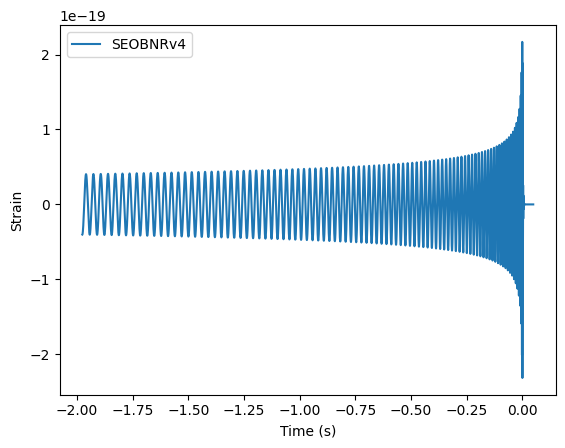

In [4]:
apx = "SEOBNRv4"
# NOTE: Inclination runs from 0 to pi, with poles at 0 and pi
#       coa_phase runs from 0 to 2 pi.
hp, hc = get_td_waveform(
    approximant="IMRPhenomT", mass1=m1, mass2=m2, delta_t=1.0 / freq, f_lower=30
)

det_h1 = Detector("H1")


signal_h1 = hp

pp.plot(signal_h1.sample_times, signal_h1, label=apx)


pp.ylabel("Strain")
pp.xlabel("Time (s)")
pp.legend()

print("peak of signal_h1: ", max(signal_h1))
print(
    "peak occurs at: ", signal_h1.sample_times[numpy.argmax(signal_h1)]
)  # 1192529719.998291
print("length of signal_h1: ", len(signal_h1))
print("min of signal_h1: ", min(signal_h1))

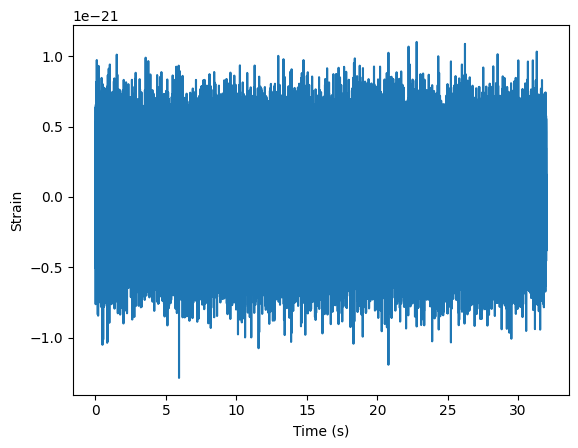

In [5]:
flow = 30.0
delta_f = 1.0 / freq
flen = int(freq / delta_f) + 1
psd = pycbc.psd.aLIGOZeroDetHighPower(flen, delta_f, flow)

# Generate 32 seconds of noise at 4096 Hz
delta_t = 1.0 / freq
tsamples = int(32 / delta_t)
ts = pycbc.noise.noise_from_psd(tsamples, delta_t, psd, seed=127)

pp.plot(ts.sample_times, ts)
pp.ylabel("Strain")
pp.xlabel("Time (s)")
pp.show()

length of signal_h1:  131072
length of ts:  131072


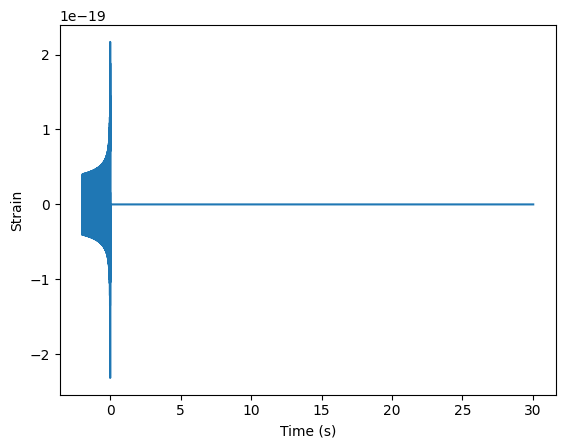

Time: -1.9760538460000001 Strain: -4.024918254437753e-20
Time: -1.9758097053750001 Strain: -4.02077386482187e-20
Time: -1.9755655647500001 Strain: -4.008114207601976e-20
Time: -1.9753214241250001 Strain: -3.986964450771085e-20
Time: -1.9750772835000001 Strain: -3.957367752182544e-20
Time: -1.9748331428750001 Strain: -3.9193851748372925e-20
Time: -1.9745890022500001 Strain: -3.873095564205415e-20
Time: -1.9743448616250001 Strain: -3.818595387813382e-20
Time: -1.9741007210000001 Strain: -3.755998537417618e-20
Time: -1.9738565803750001 Strain: -3.6854360941685634e-20
Time: -1.9736124397500001 Strain: -3.607056057234019e-20
Time: -1.9733682991250001 Strain: -3.52102303644344e-20
Time: -1.9731241585000001 Strain: -3.427517909581809e-20
Time: -1.9728800178750001 Strain: -3.326737445036859e-20
Time: -1.9726358772500001 Strain: -3.218893890590568e-20
Time: -1.9723917366250001 Strain: -3.104214529192307e-20
Time: -1.9721475960000001 Strain: -2.982941202658056e-20
Time: -1.9719034553750001 Strai

In [6]:
signal_h1.resize(len(ts))
print("length of signal_h1: ", len(signal_h1))
print("length of ts: ", len(ts))

pp.plot(signal_h1.sample_times, signal_h1, label=apx)
pp.ylabel("Strain")
pp.xlabel("Time (s)")
pp.show()

for time, strain in zip(signal_h1.sample_times, signal_h1):
    print("Time:", time, "Strain:", strain)

In [7]:
print("length of signal_h1: ", len(signal_h1))
print("length of ts: ", len(ts))

length of signal_h1:  131072
length of ts:  131072


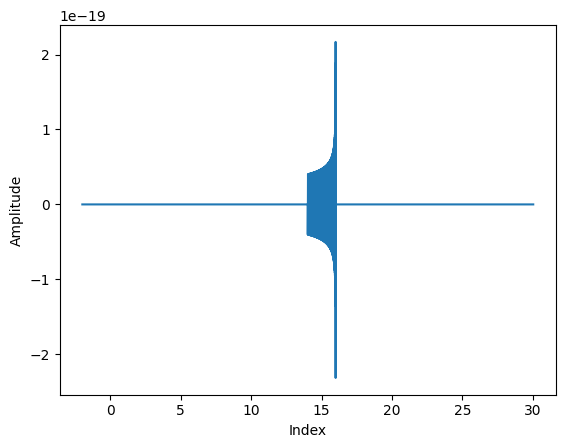

Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 

In [8]:
signal_h1_shifted = numpy.roll(signal_h1, len(signal_h1) // 2)

pp.plot(signal_h1.sample_times, signal_h1_shifted)
pp.ylabel("Amplitude")
pp.xlabel("Index")
pp.show()


for time, strain in zip(signal_h1_shifted, signal_h1_shifted):
    print("Time:", time, "Strain:", strain)

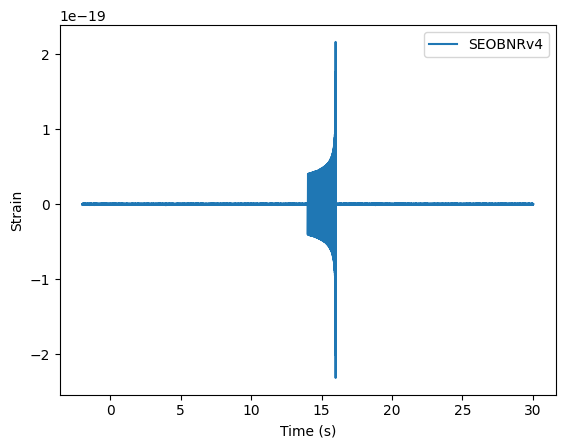

length of sampletimes:  131072
length of result:  131072


In [9]:
result = numpy.add(signal_h1_shifted, ts)

pp.plot(signal_h1.sample_times, result, label=apx)
pp.ylabel("Strain")
pp.xlabel("Time (s)")
pp.legend()
pp.show()

print("length of sampletimes: ", len(signal_h1.sample_times))
print("length of result: ", len(result))

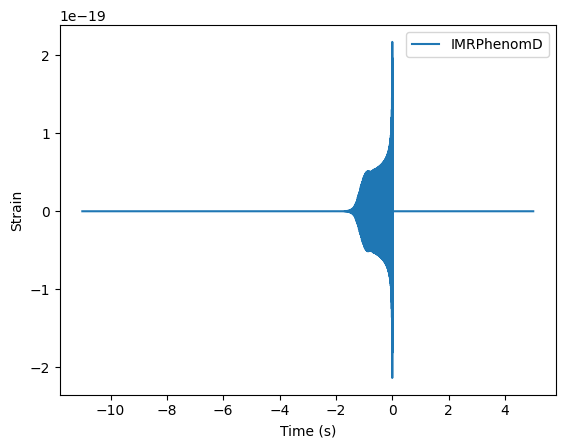

In [10]:
apx = "IMRPhenomD"
hp, hc = get_td_waveform(
    approximant=apx,
    mass1=m1,
    mass2=m2,
    spin1z=0.9,
    delta_t=1.0 / freq,
    f_lower=40,
)

pp.plot(hp.sample_times, hp, label=apx)

pp.ylabel("Strain")
pp.xlabel("Time (s)")
pp.legend()
pp.show()

length of hp:  131072


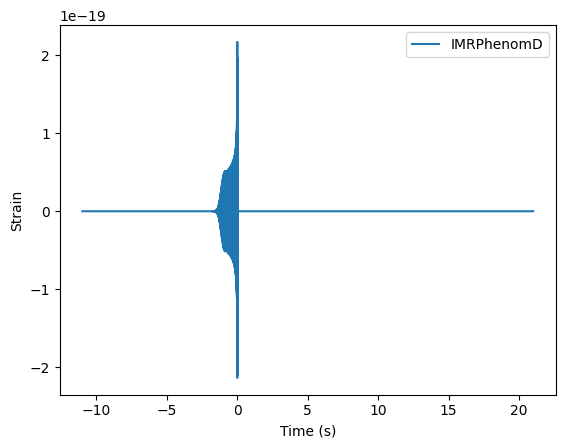

In [11]:
hp.resize(len(ts))
print("length of hp: ", len(hp))
pp.plot(hp.sample_times, hp, label=apx)

pp.ylabel("Strain")
pp.xlabel("Time (s)")
pp.legend()
pp.show()

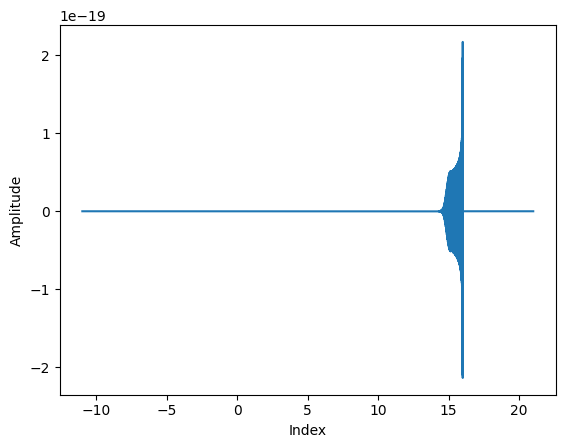

Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 Strain: 0.0
Time: 0.0 

In [12]:
hp_shifted = numpy.roll(hp, len(signal_h1) // 2)

pp.plot(hp.sample_times, hp_shifted)
pp.ylabel("Amplitude")
pp.xlabel("Index")
pp.show()


for time, strain in zip(hp_shifted, hp_shifted):
    print("Time:", time, "Strain:", strain)

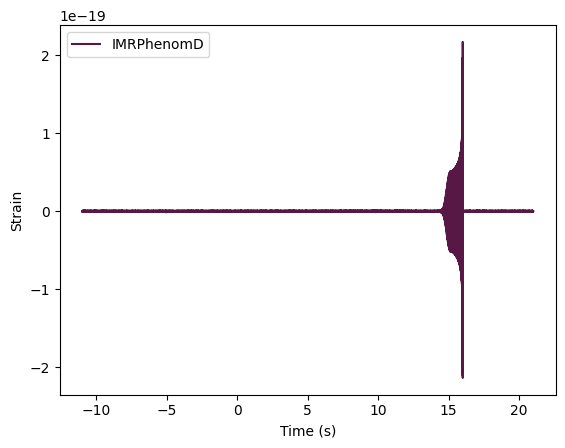

length of sampletimes:  131072
length of result:  131072


In [13]:
result = numpy.add(hp_shifted, ts)
template = hp.cyclic_time_shift(hp.start_time)
pp.plot(hp.sample_times, result, label=apx, color="#581845")
pp.ylabel("Strain")
pp.xlabel("Time (s)")
pp.legend()
pp.show()

print("length of sampletimes: ", len(signal_h1.sample_times))
print("length of result: ", len(result))

In [15]:
snr = matched_filter(template, ts, psd=psd, low_frequency_cutoff=20)

peak = abs(snr).numpy().argmax()
snrp = snr[peak]
time = snr.sample_times[peak]
snr_peak = abs(snrp)

print("We found a signal at {}s with SNR {}".format(time, snr_peak))

ValueError: PSD delta_f does not match data

(30, 1024)

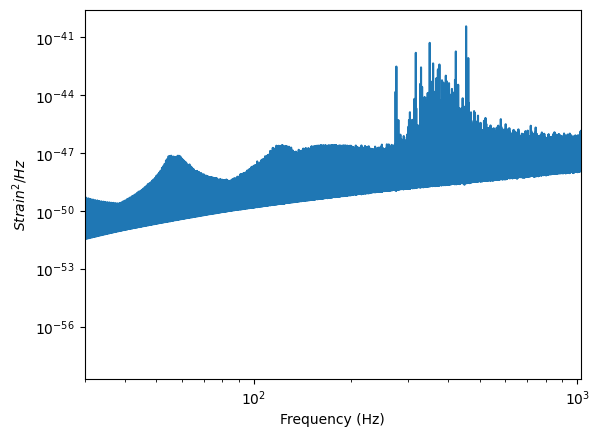

In [ ]:
pp.loglog(psd.sample_frequencies, psd)
pp.ylabel("$Strain^2 / Hz$")
pp.xlabel("Frequency (Hz)")
pp.xlim(30, 1024)